# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
import tensorflow as tf
import numpy as np
from collections import defaultdict
%matplotlib inline

In [2]:
data_dir = Path("/app/project/data/training_and_validation/")
dataset = get_dataset([i.as_posix() for i in data_dir.rglob("*tfrecord")])

INFO:tensorflow:Reading unweighted datasets: ['/app/project/data/training_and_validation/segment-11070802577416161387_740_000_760_000_with_camera_labels.tfrecord', '/app/project/data/training_and_validation/segment-10923963890428322967_1445_000_1465_000_with_camera_labels.tfrecord', '/app/project/data/training_and_validation/segment-11454085070345530663_1905_000_1925_000_with_camera_labels.tfrecord', '/app/project/data/training_and_validation/segment-10275144660749673822_5755_561_5775_561_with_camera_labels.tfrecord', '/app/project/data/training_and_validation/segment-10724020115992582208_7660_400_7680_400_with_camera_labels.tfrecord', '/app/project/data/training_and_validation/segment-11183906854663518829_2294_000_2314_000_with_camera_labels.tfrecord', '/app/project/data/training_and_validation/segment-11126313430116606120_1439_990_1459_990_with_camera_labels.tfrecord', '/app/project/data/training_and_validation/segment-1022527355599519580_4866_960_4886_960_with_camera_labels.tfrecord

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
next(iter(dataset)).keys()

dict_keys(['image', 'source_id', 'key', 'filename', 'groundtruth_image_confidences', 'groundtruth_verified_neg_classes', 'groundtruth_not_exhaustive_classes', 'groundtruth_boxes', 'groundtruth_area', 'groundtruth_is_crowd', 'groundtruth_difficult', 'groundtruth_group_of', 'groundtruth_weights', 'groundtruth_classes', 'groundtruth_image_classes', 'original_image_spatial_shape'])

In [164]:
def display_instances(batch, ax=None):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    if ax==None:
        fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(batch['image'])
    boxes = np.array(batch['groundtruth_boxes'])
    classes = np.array(batch['groundtruth_classes'])
    boxes[:,0] = boxes[:,0]*batch['image'].shape[0]
    boxes[:,2] = boxes[:,2]*batch['image'].shape[0]
    boxes[:,1] = boxes[:,1]*batch['image'].shape[1]
    boxes[:,3] = boxes[:,3]*batch['image'].shape[1]
    for box, obj_class in zip(boxes, classes):
        color = 'r' if obj_class==1 else 'g' if obj_class==2 else 'b'
        rect = patches.Rectangle((box[1], box[0]), box[3]-box[1], box[2]-box[0], linewidth=1, edgecolor=color, facecolor='none')
        ax.add_patch(rect)

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

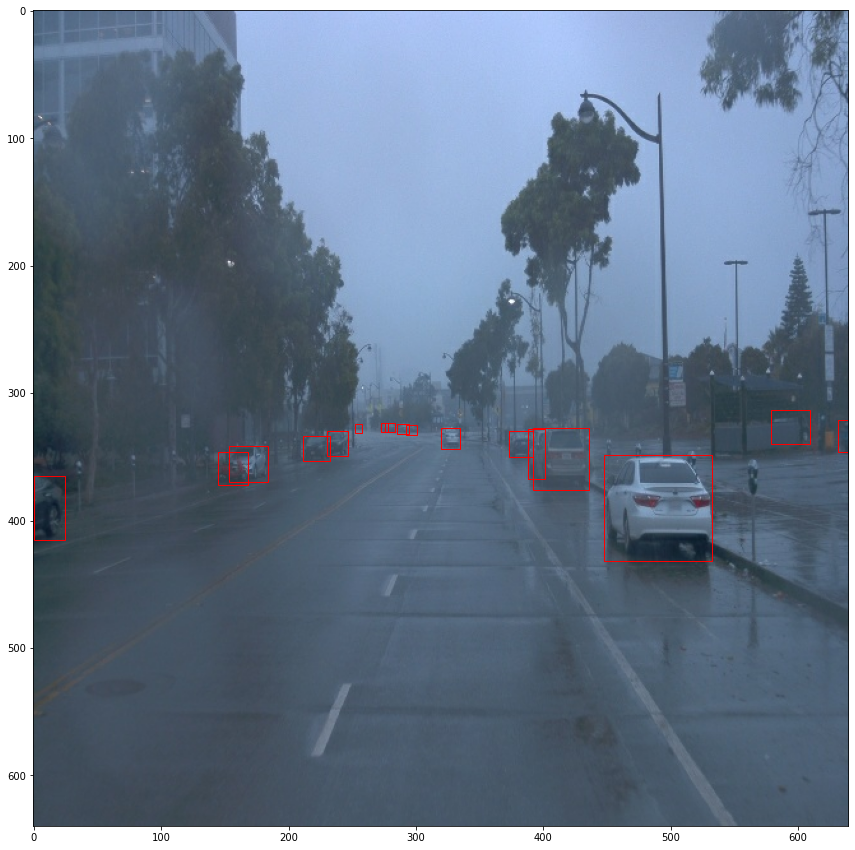

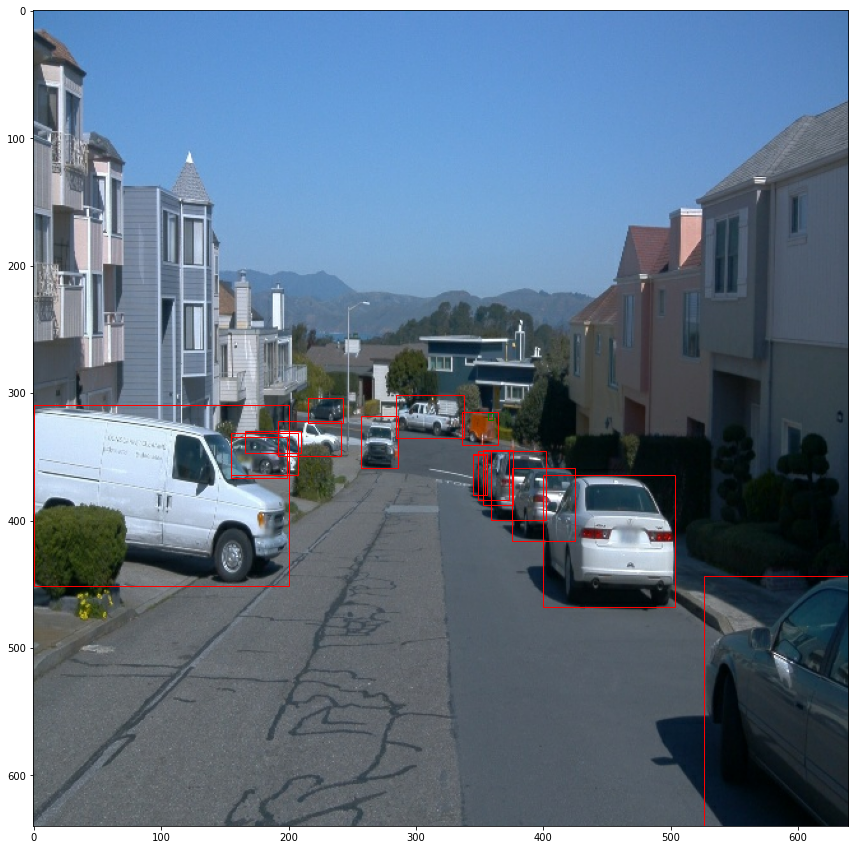

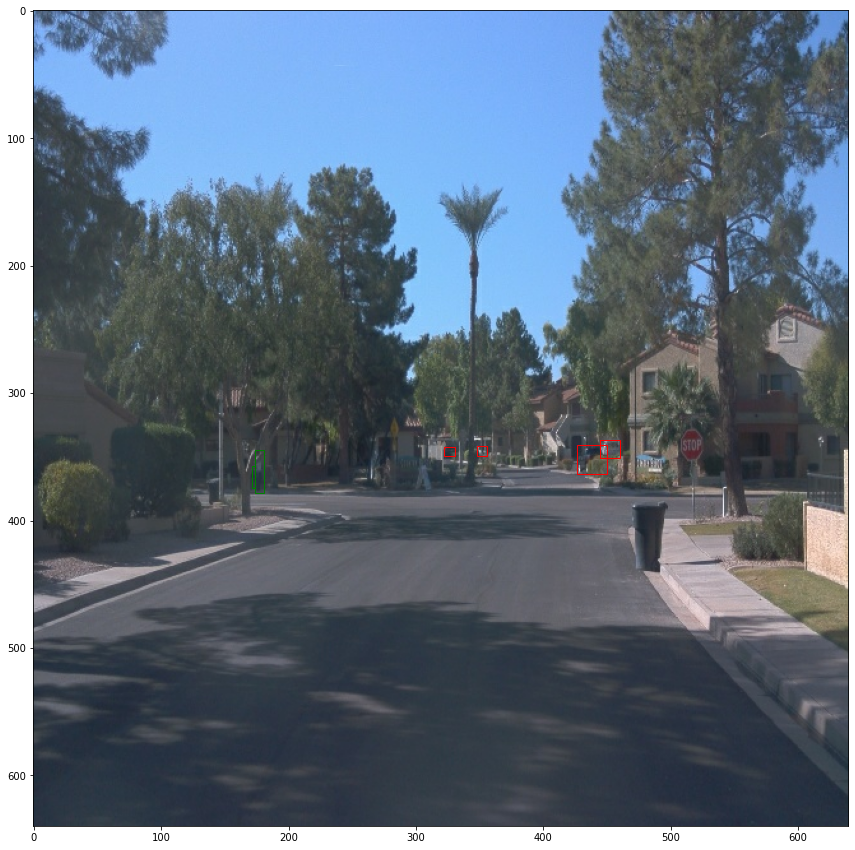

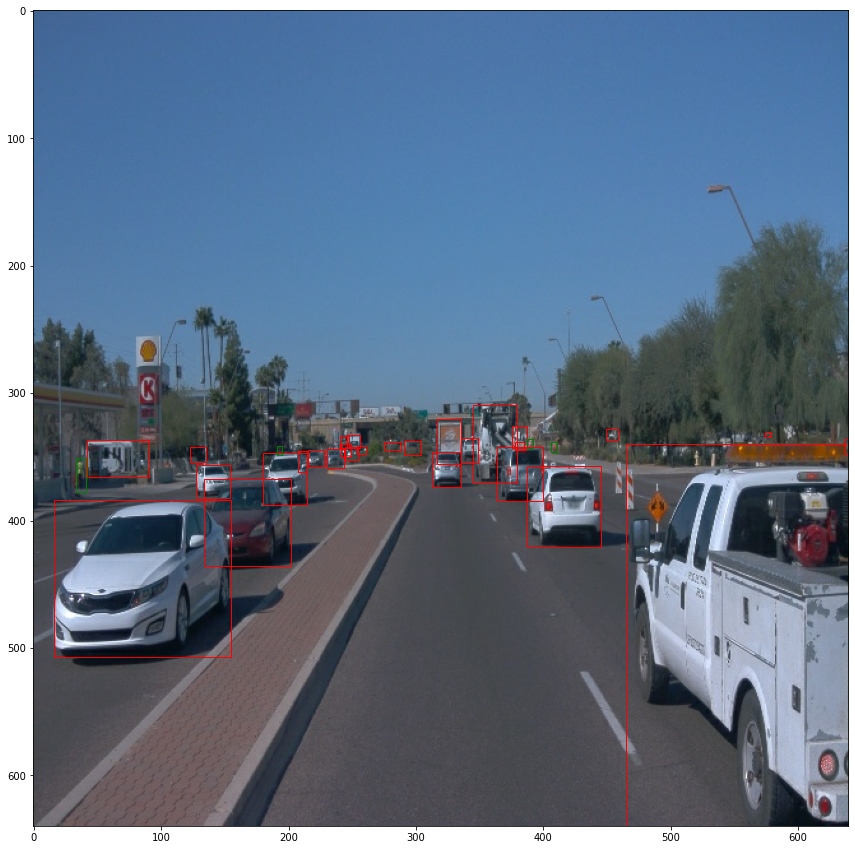

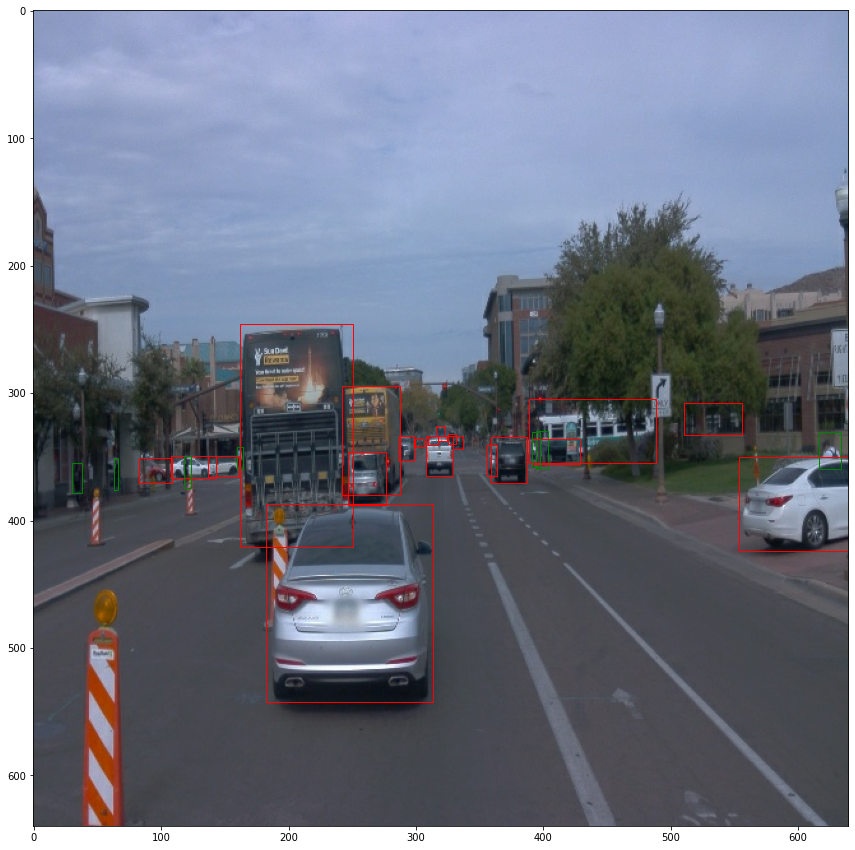

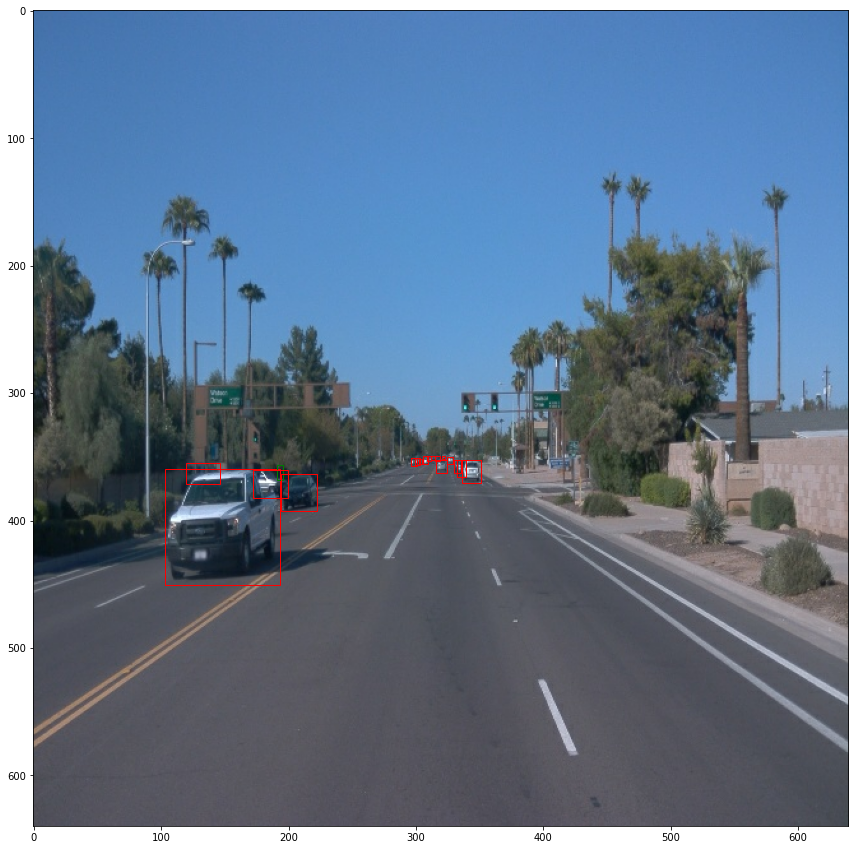

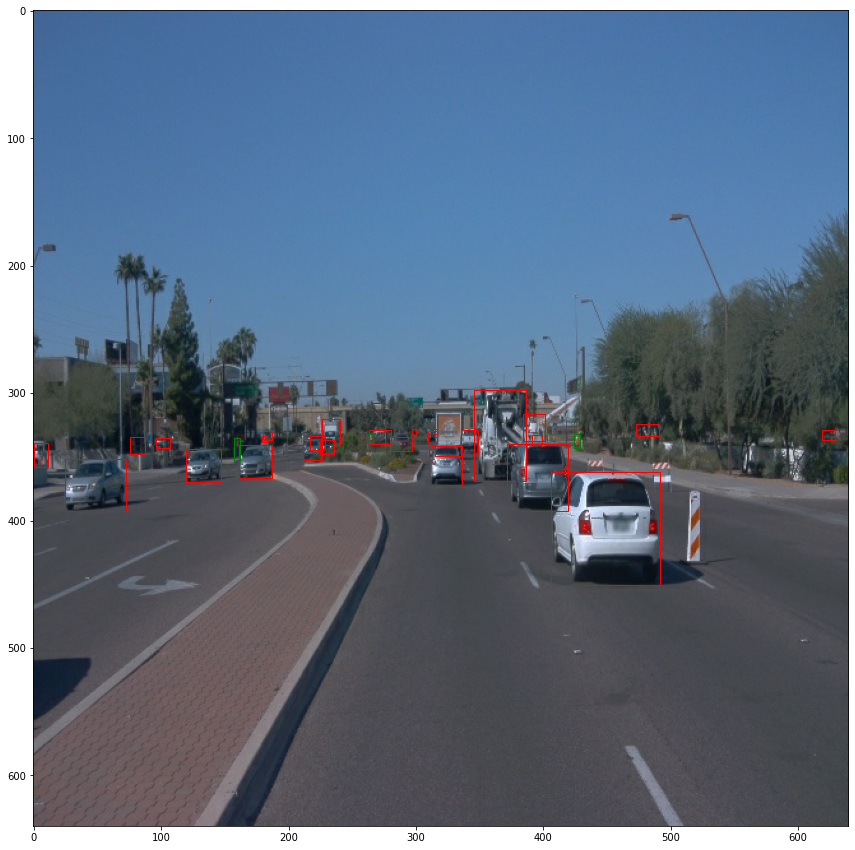

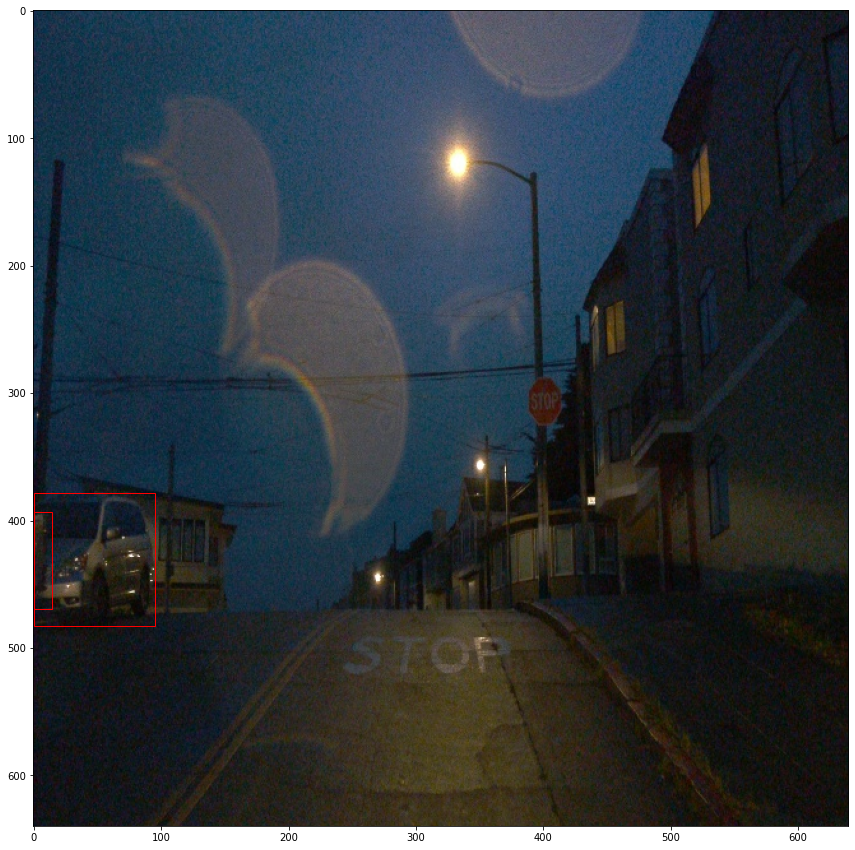

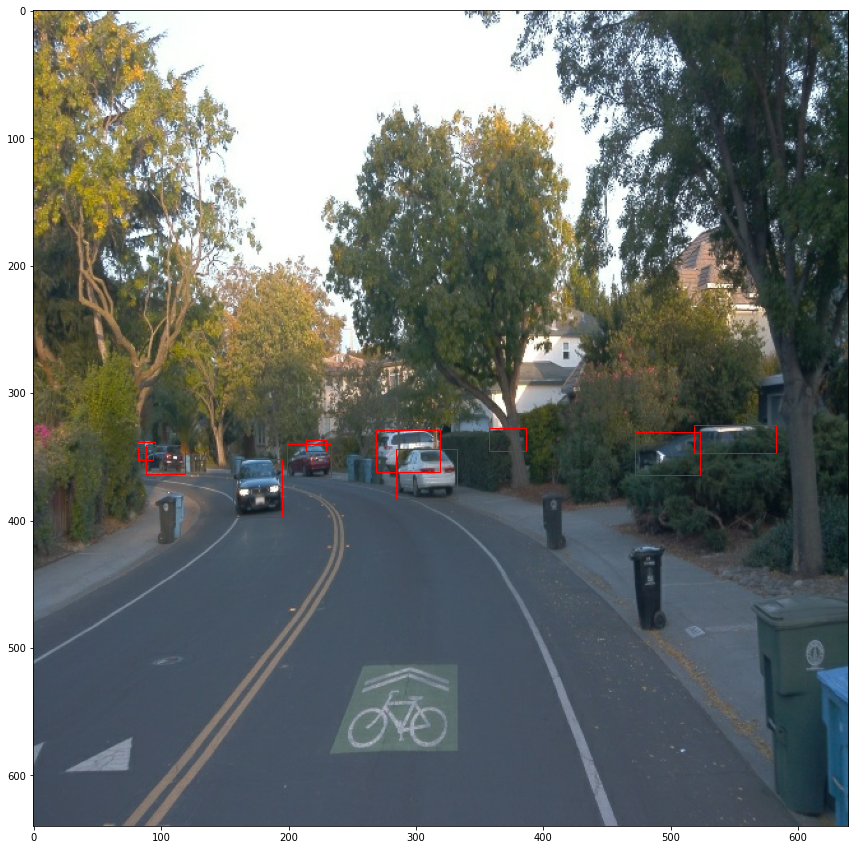

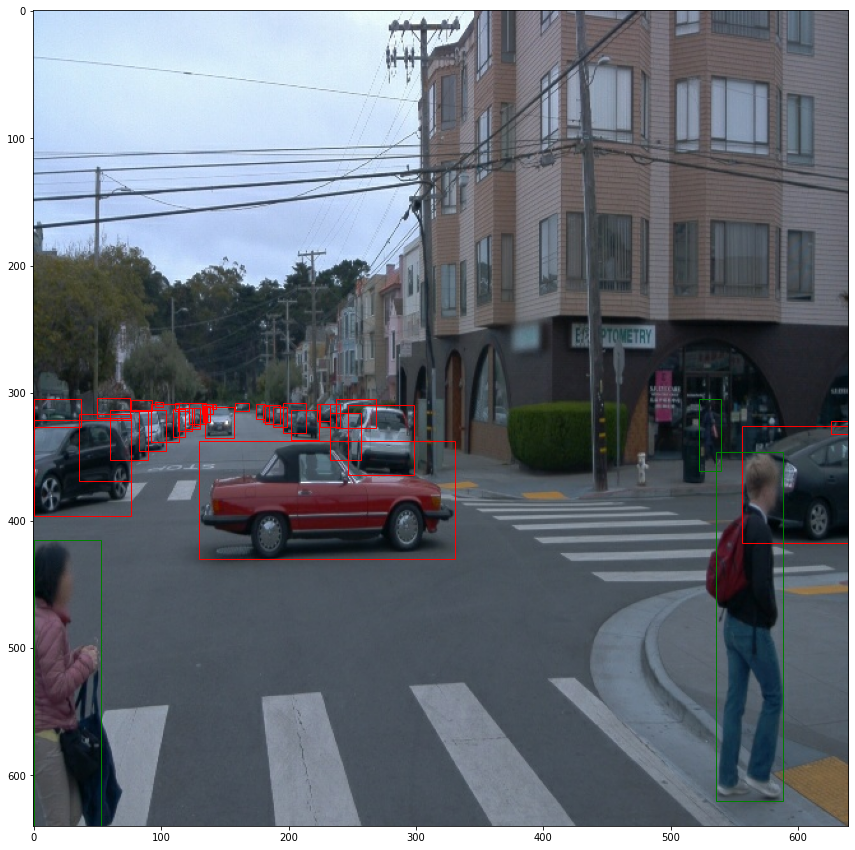

In [165]:
for batch in dataset.take(10):
    display_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [84]:
import pandas as pd

In [89]:
obs = {
        'brightness' : [],
        'box_areas' : [],
        'boxes' : [],
        'classes' : [],
        'num_objects' : [],
        'num_cars' : [],
        'num_people' : [],
        'num_cyclists' : [],
    }

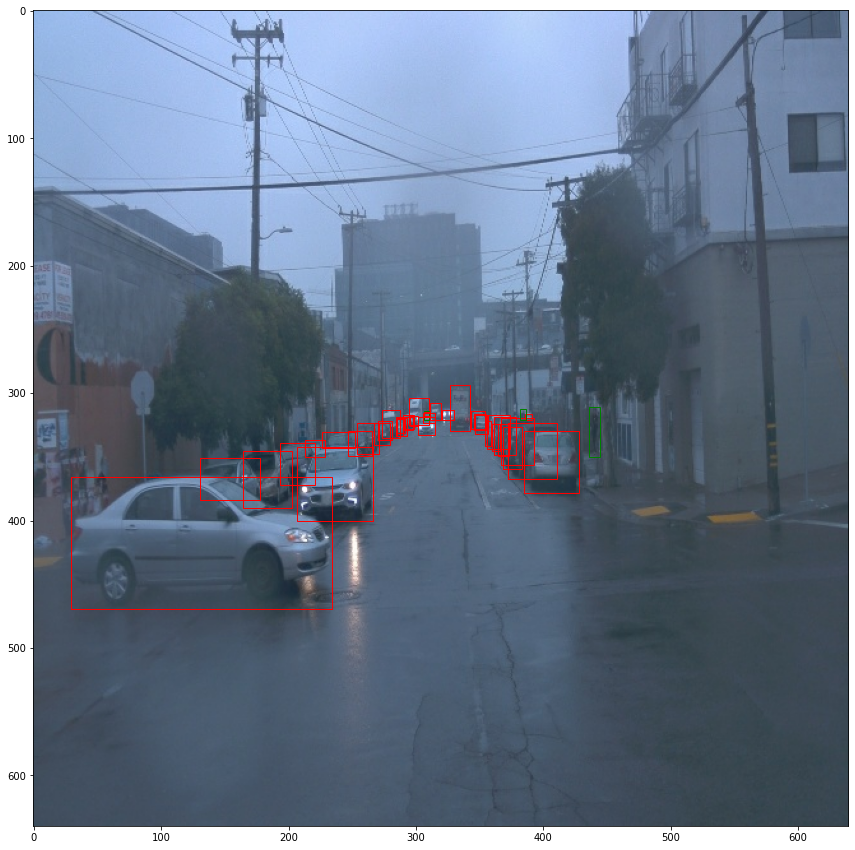

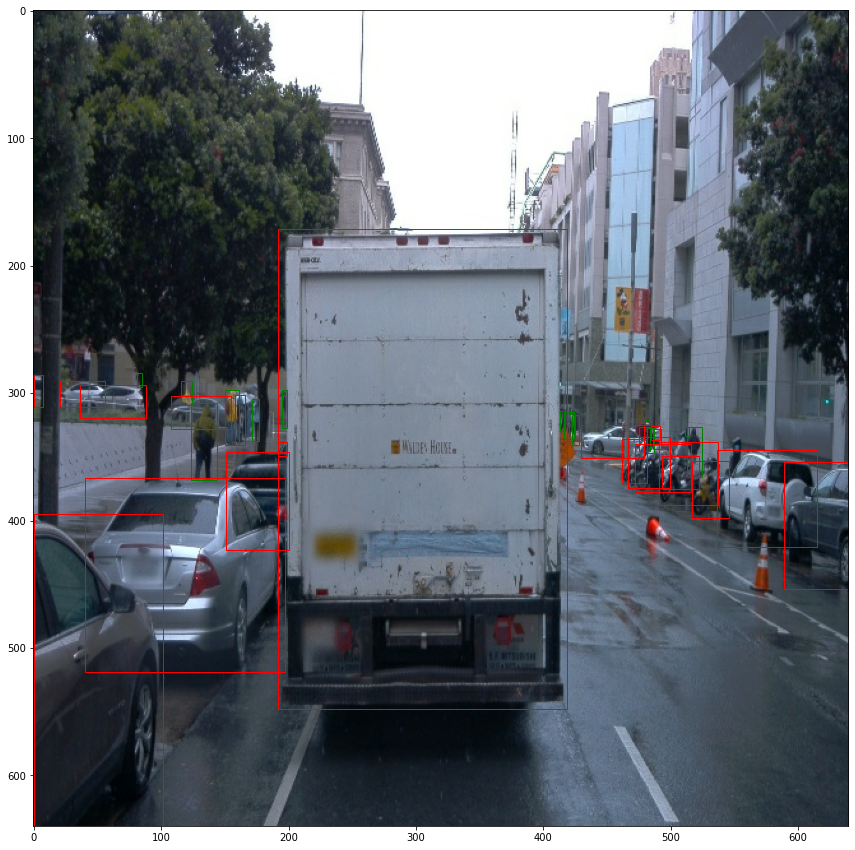

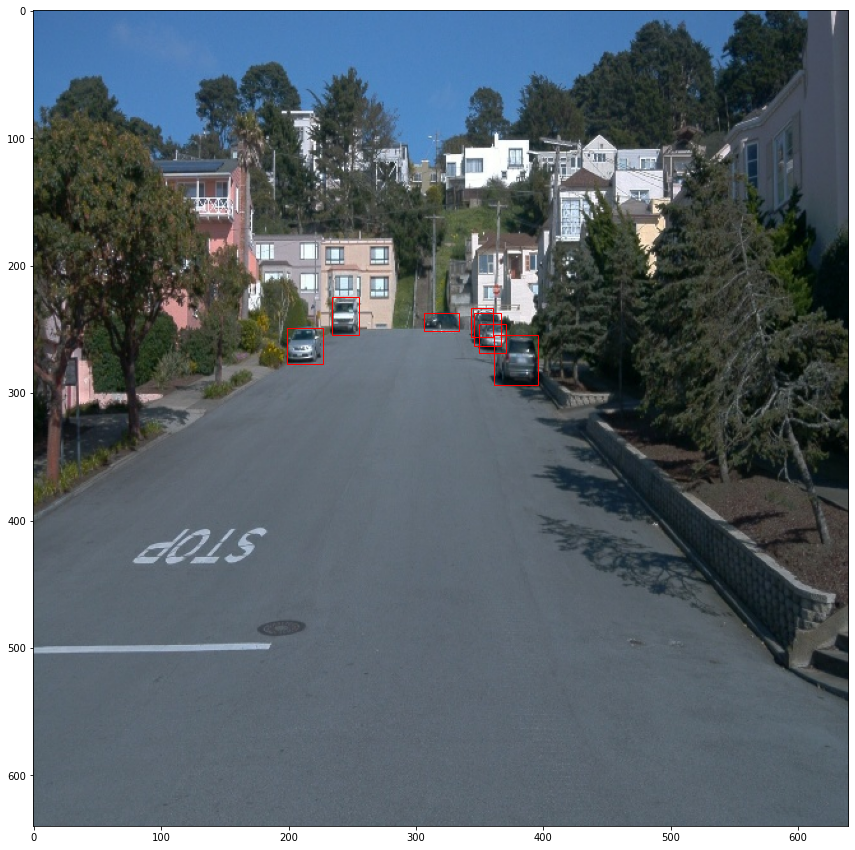

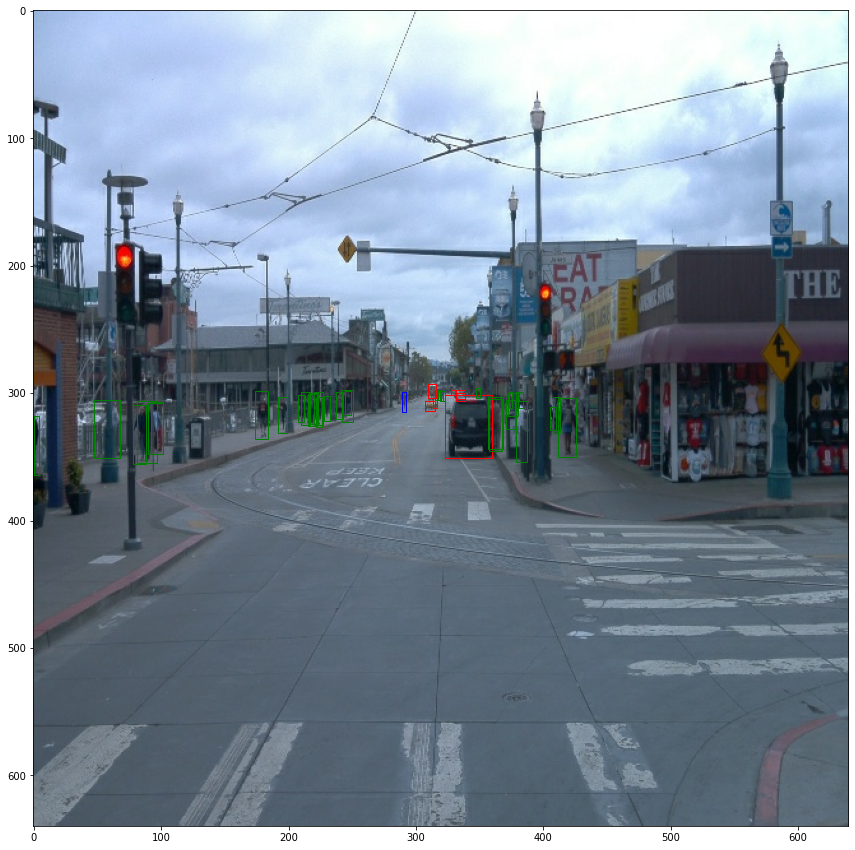

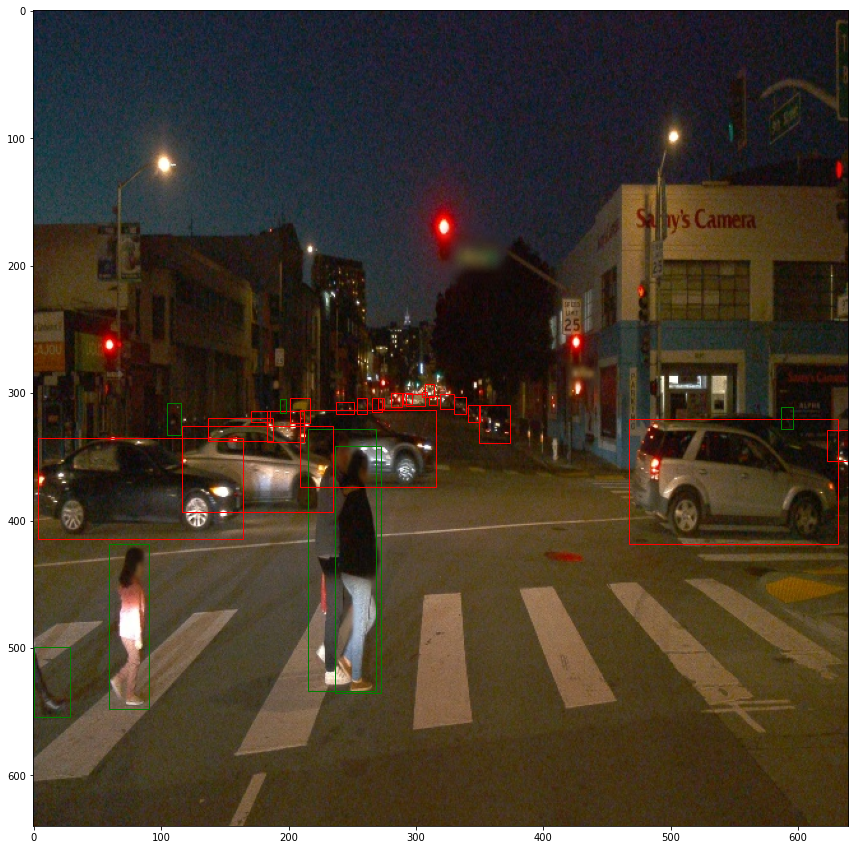

In [90]:
for batch in dataset.take(5):
    display_instances(batch)
    obs['brightness'].append(float(tf.reduce_mean(batch['image'])))
    obs['box_areas'].append([float((box[2]-box[0]) * (box[3] - box[1])) for box in batch['groundtruth_boxes'] * 640])
    obs['boxes'].append(np.array(batch['groundtruth_boxes'] * 640))
    obs['classes'].append(np.array(batch['groundtruth_classes']))
    obs['num_objects'].append(len(batch['groundtruth_classes']))
    obs['num_cars'].append(int(tf.reduce_sum(tf.cast((batch['groundtruth_classes']==1), tf.int32))))
    obs['num_people'].append(int(tf.reduce_sum(tf.cast((batch['groundtruth_classes']==2), tf.int32))))
    obs['num_cyclists'].append(int(tf.reduce_sum(tf.cast((batch['groundtruth_classes']==4), tf.int32))))

In [91]:
df = pd.DataFrame(obs)

In [92]:
df

,brightness,box_areas,boxes,classes,num_objects,num_cars,num_people,num_cyclists
0,111.0,"[484.0051574707031, 928.4526977539062, 2098.90...","[[326.21625, 368.21698, 359.0589, 382.95407], ...","[1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, ...",41,38,3,0
1,98.0,"[712.0928955078125, 23809.765625, 478.15365600...","[[290.59454, 20.75824, 310.9949, 55.66414], [3...","[1, 1, 2, 2, 1, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, ...",36,20,16,0
2,89.0,"[637.9166259765625, 1324.7662353515625, 407.68...","[[224.37234, 233.79356, 254.37286, 255.05708],...","[1, 1, 1, 1, 1, 1, 1]",7,7,0,0
3,132.0,"[109.69932556152344, 143.33555603027344, 774.2...","[[301.58423, 207.26678, 322.4267, 212.53004], ...","[2, 2, 2, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, ...",42,7,34,1
4,50.0,"[692.2357177734375, 7062.10400390625, 409.2773...","[[313.9002, 183.26637, 337.90067, 212.10898], ...","[1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, ...",30,23,7,0


In [ ]:
obs = {
        'brightness' : [],
        'box_areas' : [],
        'boxes' : [],
        'classes' : [],
        'num_objects' : [],
        'num_cars' : [],
        'num_people' : [],
        'num_cyclists' : [],
    }

for batch in dataset.take(50000):
    obs['brightness'].append(float(tf.reduce_mean(batch['image'])))
    obs['box_areas'].append([float((box[2]-box[0]) * (box[3] - box[1])) for box in batch['groundtruth_boxes'] * 640])
    obs['boxes'].append(np.array(batch['groundtruth_boxes'] * 640))
    obs['classes'].append(np.array(batch['groundtruth_classes']))
    obs['num_objects'].append(len(batch['groundtruth_classes']))
    obs['num_cars'].append(int(tf.reduce_sum(tf.cast((batch['groundtruth_classes']==1), tf.int32))))
    obs['num_people'].append(int(tf.reduce_sum(tf.cast((batch['groundtruth_classes']==2), tf.int32))))
    obs['num_cyclists'].append(int(tf.reduce_sum(tf.cast((batch['groundtruth_classes']==4), tf.int32))))

In [95]:
df = pd.DataFrame(obs)

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

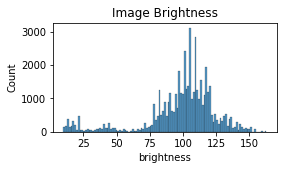

In [110]:
fig, ax = plt.subplots(figsize=(4,2))
sns_plot = sns.histplot(df['brightness'], ax=ax).set(title='Image Brightness')
plt.savefig('/app/project/project_1_figures/brightness_histogram.png', dpi=300)

In [126]:
areas = np.array([item for sublist in df['box_areas'] for item in sublist])
len(areas)

1176167

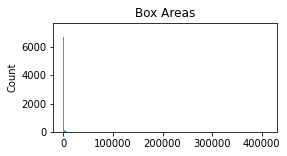

In [120]:
fig, ax = plt.subplots(figsize=(4,2))
sns_plot = sns.histplot(areas[:50000], ax=ax).set(title='Box Areas')
plt.savefig('/app/project/project_1_figures/box_areas.png', dpi=300)

In [127]:
np.percentile(areas, [i for i in range(100)])

array([2.65932381e-01, 7.97816372e+00, 1.12358303e+01, 1.43606949e+01,
       1.70199795e+01, 1.98789463e+01, 2.26045799e+01, 2.48653107e+01,
       2.76572628e+01, 2.97848625e+01, 3.24132195e+01, 3.51035538e+01,
       3.76964493e+01, 4.00530434e+01, 4.25498466e+01, 4.52093582e+01,
       4.82011414e+01, 5.15252419e+01, 5.38521423e+01, 5.70434799e+01,
       5.98359566e+01, 6.32932549e+01, 6.70158463e+01, 6.98083420e+01,
       7.31330719e+01, 7.67896347e+01, 8.03794556e+01, 8.47007141e+01,
       8.81583328e+01, 9.33440933e+01, 9.87290726e+01, 1.03050568e+02,
       1.07704979e+02, 1.12793381e+02, 1.18475471e+02, 1.24458641e+02,
       1.29643967e+02, 1.34630585e+02, 1.40543259e+02, 1.46930573e+02,
       1.54575317e+02, 1.61690094e+02, 1.69135651e+02, 1.76183739e+02,
       1.85491287e+02, 1.93071075e+02, 2.01180832e+02, 2.09425430e+02,
       2.19038986e+02, 2.29683929e+02, 2.41737000e+02, 2.53903290e+02,
       2.65671204e+02, 2.78104309e+02, 2.93208588e+02, 3.09425934e+02,
      

In [133]:
classes = np.array([item for sublist in df['classes'] for item in sublist])
#sns.barplot(x=['cars', 'people', 'bikes'], y=classes)

<AxesSubplot:ylabel='Count'>

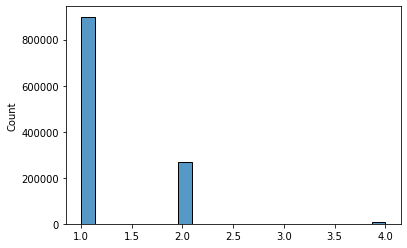

In [135]:
sns.histplot(classes)

In [143]:
cars = df['num_cars'].values
people = df['num_people'].values
bikes = df['num_cyclists'].values

In [152]:
object_dist_df = pd.DataFrame({'objects': np.array(['cars']*50000+['people']*50000+['cyclists']*50000),
                               'counts': np.concatenate([cars, people, bikes])})

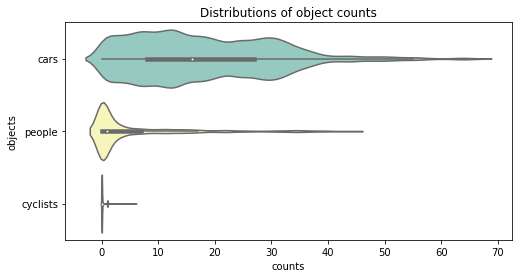

In [157]:
fig, ax = plt.subplots(figsize=(8,4))
sns.violinplot(x="counts", y="objects",
                    data=object_dist_df,
                    scale="width", palette="Set3").set(title='Distributions of object counts')
plt.savefig('/app/project/project_1_figures/object_distribution.png', dpi=300)

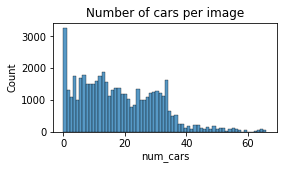

In [159]:
fig, ax = plt.subplots(figsize=(4,2))
sns_plot = sns.histplot(df['num_cars'], ax=ax).set(title='Number of cars per image')
plt.savefig('/app/project/project_1_figures/cars_histogram.png', dpi=300)

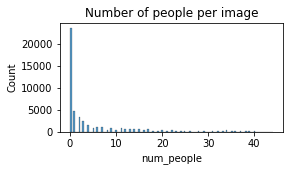

In [160]:
fig, ax = plt.subplots(figsize=(4,2))
sns_plot = sns.histplot(df['num_people'], ax=ax).set(title='Number of people per image')
plt.savefig('/app/project/project_1_figures/people_histogram.png', dpi=300)

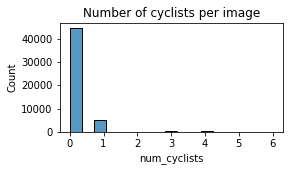

In [161]:
fig, ax = plt.subplots(figsize=(4,2))
sns_plot = sns.histplot(df['num_cyclists'], ax=ax).set(title='Number of cyclists per image')
plt.savefig('/app/project/project_1_figures/cyclist_histogram.png', dpi=300)

In [ ]:
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(5,15))
iterator = iter(dataset.take(10))
for i in range(2):
    for j in range(5):
        display_instances(next(iterator), axs[j, i])
plt.savefig('/app/project/project_1_figures/sample_images.png', dpi=300)

In [4]:
import numpy as np

In [5]:
np.__version__

'1.19.5'